In [246]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import RFE
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.linear_model import Ridge,Lasso,ElasticNet

In [10]:
df=pd.read_csv("Concrete.csv")

In [11]:
df.head()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.99
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.89
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.27
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.05
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.30


In [4]:
df.shape

(1030, 9)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
Cement (component 1)(kg in a m^3 mixture)                1030 non-null float64
Blast Furnace Slag (component 2)(kg in a m^3 mixture)    1030 non-null float64
Fly Ash (component 3)(kg in a m^3 mixture)               1030 non-null float64
Water  (component 4)(kg in a m^3 mixture)                1030 non-null float64
Superplasticizer (component 5)(kg in a m^3 mixture)      1030 non-null float64
Coarse Aggregate  (component 6)(kg in a m^3 mixture)     1030 non-null float64
Fine Aggregate (component 7)(kg in a m^3 mixture)        1030 non-null float64
Age (day)                                                1030 non-null int64
Concrete compressive strength(MPa, megapascals)          1030 non-null float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [12]:
df.corr()

,Cement,Blast Furnace Slag,Fly Ash,Water,Superplasticizer,Coarse Aggregate,Fine Aggregate,Age,Concrete compressive strength
Cement,1.000000,-0.275216,-0.397467,-0.081587,0.092386,-0.109349,-0.222718,0.081946,0.497832
Blast Furnace Slag,-0.275216,1.000000,-0.323580,0.107252,0.043270,-0.283999,-0.281603,-0.044246,0.134829
Fly Ash,-0.397467,-0.323580,1.000000,-0.256984,0.377503,-0.009961,0.079108,-0.154371,-0.105755
Water,-0.081587,0.107252,-0.256984,1.000000,-0.657533,-0.182294,-0.450661,0.277618,-0.289633
Superplasticizer,0.092386,0.043270,0.377503,-0.657533,1.000000,-0.265999,0.222691,-0.192700,0.366079
Coarse Aggregate,-0.109349,-0.283999,-0.009961,-0.182294,-0.265999,1.000000,-0.178481,-0.003016,-0.164935
Fine Aggregate,-0.222718,-0.281603,0.079108,-0.450661,0.222691,-0.178481,1.000000,-0.156095,-0.167241
Age,0.081946,-0.044246,-0.154371,0.277618,-0.192700,-0.003016,-0.156095,1.000000,0.328873
Concrete compressive strength,0.497832,0.134829,-0.105755,-0.289633,0.366079,-0.164935,-0.167241,0.328873,1.000000


In [8]:
import seaborn as sns

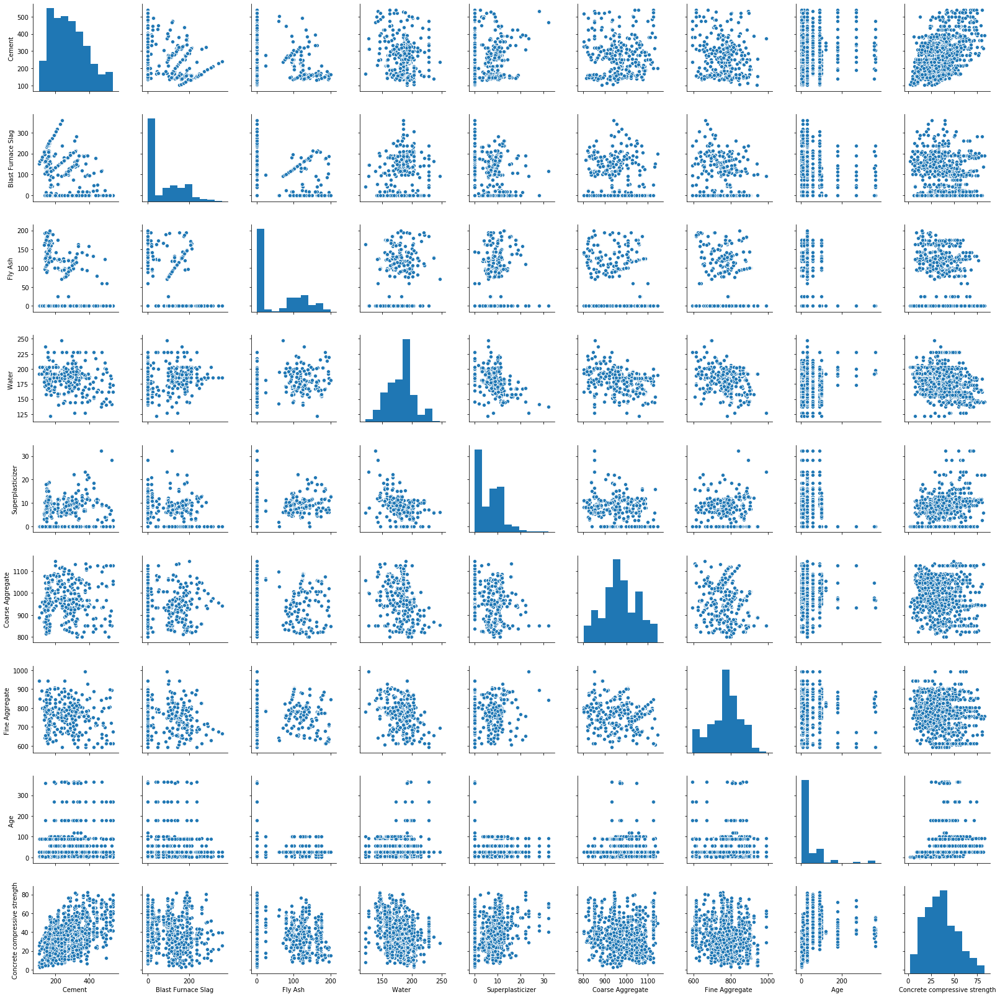

In [13]:
sns.pairplot(df)

# MVLR

In [42]:
x=df.drop('Concrete compressive strength',axis=1)
y=df['Concrete compressive strength']

In [15]:

#optimum no of features to select for RFE
nof_list=np.arange(1,17)            
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in range(len(nof_list)):
    X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.3, random_state = 0)
    model = LinearRegression()
    rfe = RFE(model,nof_list[n])
    X_train_rfe = rfe.fit_transform(X_train,y_train)
    X_test_rfe = rfe.transform(X_test)
    model.fit(X_train_rfe,y_train)
    score = model.score(X_test_rfe,y_test)
    score_list.append(score)
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 7
Score with 7 features: 0.637578


In [18]:
cols = list(x.columns)
model = LinearRegression()
#Initializing RFE model
rfe = RFE(model, 7)             
#Transforming data using RFE
X_rfe = rfe.fit_transform(x,y)  
#Fitting the data to model
model.fit(X_rfe,y)              
temp = pd.Series(rfe.support_,index = cols)
selected_features_rfe = temp[temp==True].index
print(selected_features_rfe)

Index(['Cement ', 'Blast Furnace Slag', 'Fly Ash', 'Water ',
       'Superplasticizer', 'Fine Aggregate ', 'Age '],
      dtype='object')


In [19]:
X=x[['Cement ', 'Blast Furnace Slag', 'Fly Ash', 'Water ',
       'Superplasticizer', 'Fine Aggregate ', 'Age ']]

In [20]:
m1=LinearRegression()
m2=Ridge()
m3=Lasso()
m4=ElasticNet()

In [22]:
models=[]
models.append(('MVLR',m1))
models.append(('Ridge',m2))
models.append(('Lasso',m3))
models.append(('ElasticNet',m4))

In [23]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import  model_selection

MVLR: 10.437936 (0.592382)
Ridge: 10.437935 (0.592383)
Lasso: 10.439892 (0.595253)
ElasticNet: 10.438258 (0.594082)


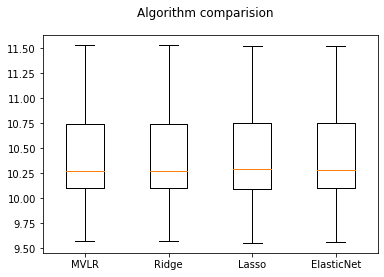

In [40]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [37]:
from sklearn.model_selection import KFold
from sklearn import metrics
kf=KFold(n_splits=5,shuffle=True,random_state=0)
for model,name in zip([m1,m2,m3,m4],['Linear_Regression','Ridge','Lasso','ElasticNet']):
    rmse=[]
    for train_idx,test_idx in kf.split(X,y):#indexes of test and train willbe stored
        Xtrain,Xtest=X.iloc[train_idx,:],X.iloc[test_idx,:]
        Ytrain,Ytest=y.iloc[train_idx],y.iloc[test_idx]
        
        model.fit(Xtrain,Ytrain)
        Y_predict=model.predict(Xtest)
        #cm=metrics.confusion_matrix(Ytest,Y_predict)
        mse=metrics.mean_squared_error(Ytest,Y_predict)
        rmse.append(np.sqrt(mse))
    print(model.score(Xtrain,Ytrain))
    print('RMSE scores:%0.03f (+/-%0.5f)[%s]'%(np.mean(rmse),np.var(rmse,ddof=1),name))

0.6108699057825211
RMSE scores:10.478 (+/-0.41625)[Linear_Regression]
0.6108699057759036
RMSE scores:10.478 (+/-0.41625)[Ridge]
0.6107124071917626
RMSE scores:10.481 (+/-0.42347)[Lasso]
0.6108198926396965
RMSE scores:10.479 (+/-0.42096)[ElasticNet]


In [26]:
from scipy.stats import levene

In [27]:
levene(df['Blast Furnace Slag'],df['Concrete compressive strength']) #bfs variance is not equal to ccs variance so it is affecting

LeveneResult(statistic=716.5702375124835, pvalue=1.0602702086604272e-135)

In [28]:
df.columns

Index(['Cement ', 'Blast Furnace Slag', 'Fly Ash', 'Water ',
       'Superplasticizer', 'Coarse Aggregate', 'Fine Aggregate ', 'Age ',
       'Concrete compressive strength'],
      dtype='object')

In [32]:
levene(df['Fly Ash'],df['Concrete compressive strength'])

LeveneResult(statistic=407.83846547932365, pvalue=6.895004041513094e-83)

In [30]:
df['Fly Ash'].mean()

54.18834951456309

# KNN

In [43]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
for i in x.columns:
    x[i]=sc.fit_transform(x[[i]])

In [47]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor

In [51]:
knn=KNeighborsRegressor()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=GridSearchCV(knn,params,cv=7,scoring='neg_mean_squared_error')
GS.fit(x,y)

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


GridSearchCV(cv=7, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  3...
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
       196, 197, 198, 199]),
           

In [52]:
GS.best_params_

{'n_neighbors': 9, 'weights': 'distance'}

In [60]:
knn=KNeighborsRegressor(n_neighbors=9,weights='distance')

In [64]:
m1=LinearRegression()
models.append(('MVLR',m1))

In [61]:
models=[]
models.append(('knnn',knn))

knnn: 7.429258 (0.615279)
MVLR: 10.437936 (0.592382)


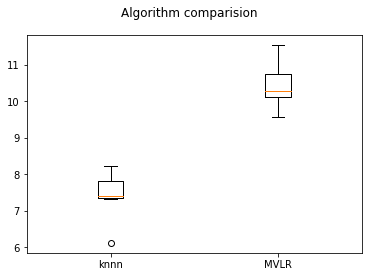

In [65]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

# Decision Tree

In [2]:
from sklearn.tree import DecisionTreeRegressor,DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier
from sklearn.ensemble import BaggingRegressor,BaggingClassifier
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,AdaBoostClassifier,GradientBoostingClassifier

In [5]:
help(GradientBoostingRegressor)

Help on class GradientBoostingRegressor in module sklearn.ensemble.gradient_boosting:

class GradientBoostingRegressor(BaseGradientBoosting, sklearn.base.RegressorMixin)
 |  GradientBoostingRegressor(loss='ls', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, min_impurity_split=None, init=None, random_state=None, max_features=None, alpha=0.9, verbose=0, max_leaf_nodes=None, warm_start=False, presort='auto', validation_fraction=0.1, n_iter_no_change=None, tol=0.0001)
 |  
 |  Gradient Boosting for regression.
 |  
 |  GB builds an additive model in a forward stage-wise fashion;
 |  it allows for the optimization of arbitrary differentiable loss functions.
 |  In each stage a regression tree is fit on the negative gradient of the
 |  given loss function.
 |  
 |  Read more in the :ref:`User Guide <gradient_boosting>`.
 |  
 |  Parameters
 |  --------

In [149]:
dt_model=DecisionTreeRegressor(criterion='mse',random_state=0)
rf_model=RandomForestRegressor(n_estimators=537,criterion='mse',random_state=0)
bag_model=BaggingRegressor(n_estimators=10,random_state=0)
model_ada=AdaBoostRegressor(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingRegressor(,n_estimators=2600,random_state=0)
model_ada_rf=AdaBoostRegressor(base_estimator=rf_model,n_estimators=100,random_state=0)#fully grown decision tree high bias error

In [150]:
models=[]
models.append(('MVLR',m1))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))

In [151]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

MVLR: 10.437936 (0.592382)
Knn: 7.429258 (0.615279)
Decision Tree: 6.550930 (0.758675)
RandomForest: 4.821106 (0.379964)
BaggedDT: 5.242696 (0.388942)
Adaboost_DT: 7.566921 (0.491238)
GradientBoosting: 3.998306 (0.365768)


KeyboardInterrupt: 

In [164]:
bag_grad=BaggingRegressor(base_estimator=model_grad,n_estimators=50,random_state=0)

In [165]:
models=[]
models.append(('MVLR',m1))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))

MVLR: 10.437936 (0.592382)
Knn: 7.429258 (0.615279)
Decision Tree: 6.550930 (0.758675)
RandomForest: 4.821106 (0.379964)
BaggedDT: 5.242696 (0.388942)
Adaboost_DT: 7.566921 (0.491238)
GradientBoosting: 3.998306 (0.365768)
Adaboost_RF: 4.812251 (0.359142)
Gradbagg: 3.966829 (0.337902)
stacked: 3.973996 (0.328517)


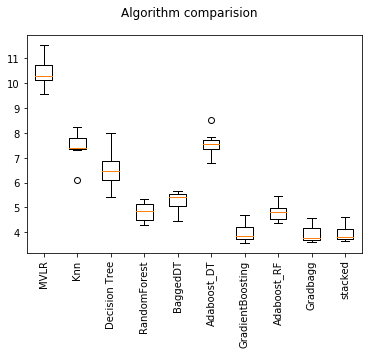

In [167]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

In [244]:
from sklearn.ensemble import VotingRegressor,VotingClassifier

In [245]:
from xgboost import XGBRegressor,XGBClassifier

In [204]:
model_xgb=XGBRegressor(n_estimators=2300,learning_rate=0.056,objective='reg:squarederror',booster='gbtree',max_depth=5)

In [162]:
stacked=VotingRegressor(estimators=[('Gradbagg',bag_grad),('GBOOst',model_grad),('RandomForest',rf_model)])

In [166]:
models.append(('stacked',stacked))

In [205]:
models=[]
models.append(('xgb',model_xgb))

In [ ]:
from xgboost import XGBRegressor,XGBClassifier

model_xgb=XGBRegressor(n_estimators=2300,learning_rate=0.056,objective='reg:squarederror',booster='gbtree',max_depth=5)



models=[]
models.append(('xgb',model_xgb))
models.fit(X,y)
model.predict(test)
model_xgb._feature_importance

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is 

xgb: 3.901600 (0.457148)


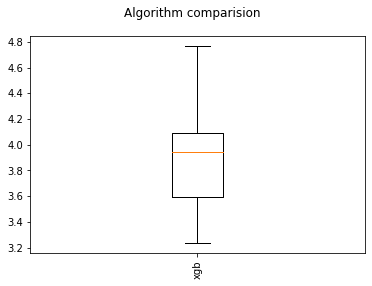

In [206]:
results=[]
names=[]
for name,model in models:
    kfold=model_selection.KFold(n_splits=7,shuffle=True,random_state=0)
    cv_result=model_selection.cross_val_score(model,X,y,cv=kfold,scoring='neg_mean_squared_error')
    results.append(np.sqrt(np.abs(cv_result)))
    names.append(name)
    print("%s: %f (%f)" % (name,np.mean(np.sqrt(np.abs(cv_result))),np.std(np.sqrt(np.abs(cv_result)))))
fig=plt.figure()
fig.suptitle("Algorithm comparision")
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=90)
plt.show()

In [207]:

bag_grad.fit(x[:1000],y[:1000])
ypred=bag_grad.predict([x.iloc[1010,:]])
ypred
y[1010]

40.06

In [208]:
ypred

array([37.17953898])

In [209]:
model_grad.fit(x[:1000],y[:1000])
ypred=model_grad.predict([x.iloc[1010,:]])
ypred


array([39.95855808])

In [210]:
y[1010]

40.06

In [213]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [214]:
df=pd.read_csv('wisc_bc_data.csv')

In [215]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [218]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [219]:
df['diagnosis'].replace({'B':0,'M':1},inplace=True)

In [220]:
df.corr()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,points_se,symmetry_se,dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
id,1.000000,0.039769,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,-0.022114,-0.052511,0.143048,-0.007526,0.137331,0.177742,0.096781,0.033961,0.055239,0.078768,-0.017306,0.025725,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
diagnosis,0.039769,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,0.330499,-0.012838,0.567134,-0.008303,0.556141,0.548236,-0.067016,0.292999,0.253730,0.408042,-0.006522,0.077972,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.074626,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,0.679090,-0.097317,0.674172,0.735864,-0.222600,0.206000,0.194204,0.376169,-0.104321,-0.042641,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,0.275869,0.386358,0.281673,0.259845,0.006614,0.191975,0.143293,0.163851,0.009127,0.054458,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,0.691765,-0.086761,0.693135,0.744983,-0.202694,0.250744,0.228082,0.407217,-0.081629,-0.005523,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,0.732562,-0.066280,0.726628,0.800086,-0.166777,0.212583,0.207660,0.372320,-0.072497,-0.019887,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,0.301467,0.068406,0.296092,0.246552,0.332375,0.318943,0.248396,0.380676,0.200774,0.283607,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,0.497473,0.046205,0.548905,0.455653,0.135299,0.738722,0.570517,0.642262,0.229977,0.507318,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,0.631925,0.076218,0.660391,0.617427,0.098564,0.670279,0.691270,0.683260,0.178009,0.449301,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
points_mean,0.044158,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,0.698050,0.021480,0.710650,0.690299,0.027653,0.490424,0.439167,0.615634,0.095351,0.257584,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661


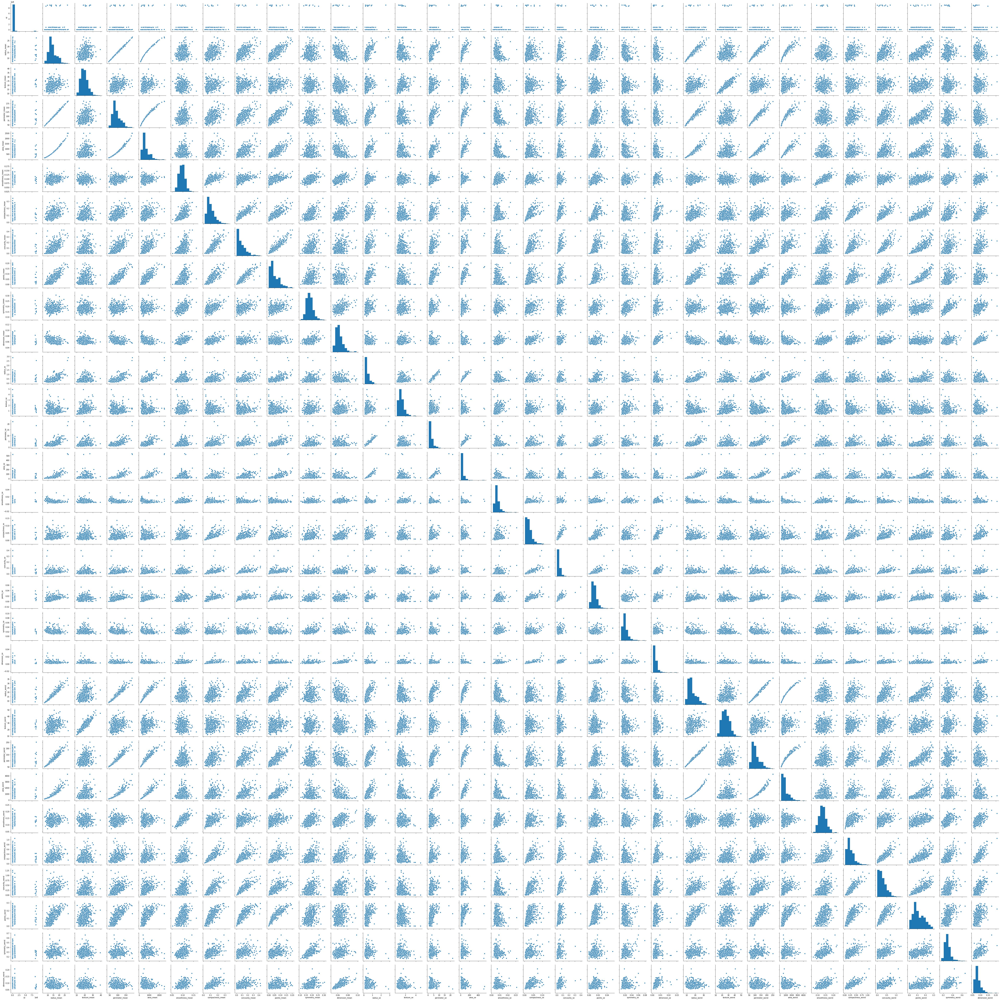

In [217]:
sns.pairplot(df)

In [221]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst'],
      dtype='object')

In [222]:
df.corr()['diagnosis']

id                   0.039769
diagnosis            1.000000
radius_mean          0.730029
texture_mean         0.415185
perimeter_mean       0.742636
area_mean            0.708984
smoothness_mean      0.358560
compactness_mean     0.596534
concavity_mean       0.696360
points_mean          0.776614
symmetry_mean        0.330499
dimension_mean      -0.012838
radius_se            0.567134
texture_se          -0.008303
perimeter_se         0.556141
area_se              0.548236
smoothness_se       -0.067016
compactness_se       0.292999
concavity_se         0.253730
points_se            0.408042
symmetry_se         -0.006522
dimension_se         0.077972
radius_worst         0.776454
texture_worst        0.456903
perimeter_worst      0.782914
area_worst           0.733825
smoothness_worst     0.421465
compactness_worst    0.590998
concavity_worst      0.659610
points_worst         0.793566
symmetry_worst       0.416294
dimension_worst      0.323872
Name: diagnosis, dtype: float64

In [227]:
X=df.drop(['id','diagnosis','dimension_mean','texture_se','smoothness_se','symmetry_se','dimension_se'],axis=1)
y=df['diagnosis']

In [228]:
X.shape

(569, 25)

In [229]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 25 columns):
radius_mean          569 non-null float64
texture_mean         569 non-null float64
perimeter_mean       569 non-null float64
area_mean            569 non-null float64
smoothness_mean      569 non-null float64
compactness_mean     569 non-null float64
concavity_mean       569 non-null float64
points_mean          569 non-null float64
symmetry_mean        569 non-null float64
radius_se            569 non-null float64
perimeter_se         569 non-null float64
area_se              569 non-null float64
compactness_se       569 non-null float64
concavity_se         569 non-null float64
points_se            569 non-null float64
radius_worst         569 non-null float64
texture_worst        569 non-null float64
perimeter_worst      569 non-null float64
area_worst           569 non-null float64
smoothness_worst     569 non-null float64
compactness_worst    569 non-null float64
concavity_wor

In [230]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
for i in X.columns:
    X[i]=sc.fit_transform(X[[i]])

In [231]:
eig_val,eig_vec=np.linalg.eig(X.cov())

In [232]:
eig_pairs=[(eig_val[index],eig_vec[:,index]) for index in range(len(eig_val))]

eig_pairs.sort()
eig_pairs.reverse()

eig_pairs

eig_val_sort=[eig_pairs[index][0] for index in range(len(eig_val))]
eig_vec_sort=[eig_pairs[index][1] for index in range(len(eig_val))]

In [233]:
tot=sum(eig_val_sort)
var_exp=[(i/tot)*100 for i in sorted(eig_val,reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print("Cummulative Variance Explained ",cum_var_exp)

Cummulative Variance Explained  [ 52.38932985  69.56525746  77.41853575  84.20098222  88.75290641
  92.08287521  94.36966418  95.72453898  96.72088573  97.41338834
  98.02814042  98.47442146  98.79926842  99.06278132  99.29311732
  99.48617475  99.65567739  99.7655968   99.84939859  99.92145132
  99.95976049  99.98959387  99.99626925  99.99945631 100.        ]


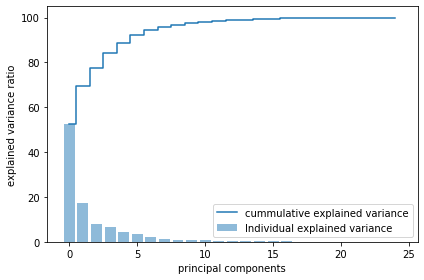

In [235]:
plt.figure(figsize=(6,4))
plt.bar(range(X.shape[1]),var_exp,alpha=0.5,align='center',label='Individual explained variance')
plt.step(range(X.shape[1]),cum_var_exp,where='mid',label='cummulative explained variance')
plt.ylabel("explained variance ratio")
plt.xlabel("principal components")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [236]:
eig_vec_sort=np.array(eig_vec_sort[::]).T

In [355]:
P_reduce=eig_vec_sort[:,:8] #1 dimension which has low variance ratio we reduce

In [356]:
P_reduce.shape

(25, 8)

In [357]:
dfpca=np.dot(X,P_reduce)

In [358]:
X_PCA=pd.DataFrame(dfpca,columns='pc1 pc2 pc3 pc4 pc5 pc6 pc7 pc8'.split())
X_PCA.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8
0,-2.435528,-0.311040,1.029146,2.072855,-0.088952,-0.124366,0.929895,-0.158729
1,-1.604055,-1.111972,1.168413,-0.404756,0.908187,-0.501474,-0.127763,0.407821
2,-2.884022,-0.622225,-0.648709,0.873389,0.623275,0.451911,0.285519,-0.139383
3,-2.024122,-0.984558,2.368593,1.226611,0.311186,1.379495,1.023477,0.945775
4,-2.272882,1.467035,0.782330,1.039939,-1.737994,-0.571840,0.209379,0.281846


In [359]:
model_log=LogisticRegression()

In [252]:
knn=KNeighborsRegressor()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=GridSearchCV(knn,params,cv=7,scoring='roc_auc')
GS.fit(X_PCA,y)

GridSearchCV(cv=7, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  3...
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 188, 189

In [253]:
GS.best_params_

{'n_neighbors': 11, 'weights': 'distance'}

In [360]:
knn=KNeighborsRegressor(n_neighbors=11,weights='distance')

In [361]:
knn=KNeighborsRegressor(n_neighbors=11,weights='distance')
navbayes_model=GaussianNB()
model_log=LogisticRegression()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
rf_model=RandomForestClassifier(n_estimators=537,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=2600,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=100,random_state=0)#fully grown decision tree high bias error

In [378]:
stacked=VotingClassifier(estimators=[('Logistic',model_log),('adaGBOOst',model_ada),('RF',rf_model)],voting='soft')

models.append(('stacked',stacked))

In [379]:
models=[]
models.append(('LR',model_log))
models.append(('NB',navbayes_model))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))
models.append(('stacked',stacked))

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 

LR: 99.615491
		Bais error :  0.003845087673332137
		Variance error:  1.776706632891142e-05
NB: 97.927756
		Bais error :  0.020722441455206186
		Variance error:  0.00017972201730364552
Knn: 99.078463
		Bais error :  0.009215373889936984
		Variance error:  4.7537380231681294e-05
Decision Tree: 92.523408
		Bais error :  0.07476592108072211
		Variance error:  0.0003415213365619103
RandomForest: 99.022754
		Bais error :  0.009772464732368924
		Variance error:  2.227627392715339e-05
BaggedDT: 97.777837
		Bais error :  0.022221628407386285
		Variance error:  0.0002162182530354292
Adaboost_DT: 98.846208
		Bais error :  0.011537922507368292
		Variance error:  6.285260734662993e-05
GradientBoosting: 98.656753
		Bais error :  0.013432468080770699
		Variance error:  0.0001144457986607656
Adaboost_RF: 99.098411
		Bais error :  0.009015892938389003
		Variance error:  2.7814693014823765e-05
Gradbagg: 93.596668
		Bais error :  0.06403331743019558
		Variance error:  0.003291207178849123


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 

stacked: 99.436341
		Bais error :  0.005636589158842242
		Variance error:  1.7420404781837524e-05


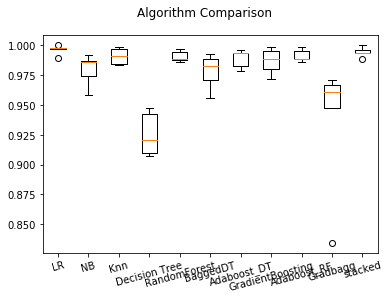

In [380]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='roc_auc')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

In [300]:
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
model_ada=AdaBoostClassifier(n_estimators=10,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=10,random_state=0)
bag_model=BaggingClassifier(n_estimators=100,random_state=0)
model_xgb=XGBClassifier(n_estimators=100,learning_rate=0.056,objective='reg:squarederror',booster='gbtree',max_depth=5)
bag_grad=BaggingClassifier(base_estimator=model_grad,n_estimators=1,random_state=0)
#fully grown decision tree high bias error

In [301]:
models=[]
models.append(('Decision Tree',dt_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('xgb',model_xgb))
models.append(('baggedgrad',bag_grad))

Decision Tree: 92.523408
		Bais error :  0.07476592108072211
		Variance error:  0.0003415213365619103
BaggedDT: 98.821202
		Bais error :  0.011787978159981671
		Variance error:  4.827521682873465e-05
Adaboost_DT: 98.681064
		Bais error :  0.013189355493949284
		Variance error:  8.428093011021388e-05
GradientBoosting: 98.034223
		Bais error :  0.019657765027342622
		Variance error:  0.0002424938703809329
xgb: 98.694892
		Bais error :  0.013051080174981022
		Variance error:  8.242568372476218e-05
baggedgrad: 93.596668
		Bais error :  0.06403331743019558
		Variance error:  0.003291207178849123


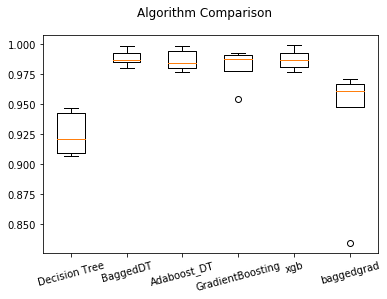

In [303]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='roc_auc')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

for classifier we should try to increase the value and is opposite in regression

In [309]:
model_log.fit(x[:500],y[:500])
ypred=model_log.predict([x.iloc[501,:]])
ypred



C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([1], dtype=int64)

In [310]:
y[501]

1

In [339]:
P_reduce=eig_vec_sort[:,:2] #1 dimension which has low variance ratio we reduce

In [340]:
P_reduce.shape

(25, 9)

In [341]:
dfpca=np.dot(X,P_reduce)

In [342]:
X_PCA=pd.DataFrame(dfpca,columns='pc1 pc2 pc3 pc4 pc5 pc6 pc7 pc8 pc9'.split())
X_PCA.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8,pc9
0,-2.435528,-0.311040,1.029146,2.072855,-0.088952,-0.124366,0.929895,-0.158729,0.208061
1,-1.604055,-1.111972,1.168413,-0.404756,0.908187,-0.501474,-0.127763,0.407821,0.183228
2,-2.884022,-0.622225,-0.648709,0.873389,0.623275,0.451911,0.285519,-0.139383,-0.025701
3,-2.024122,-0.984558,2.368593,1.226611,0.311186,1.379495,1.023477,0.945775,0.522669
4,-2.272882,1.467035,0.782330,1.039939,-1.737994,-0.571840,0.209379,0.281846,0.007011


In [343]:
model_log=LogisticRegression()

In [344]:
knn=KNeighborsRegressor()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=GridSearchCV(knn,params,cv=7,scoring='roc_auc')
GS.fit(X_PCA,y)

GridSearchCV(cv=7, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  3...
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 188, 189

In [345]:
GS.best_params_

{'n_neighbors': 10, 'weights': 'distance'}

In [346]:
knn=KNeighborsRegressor(n_neighbors=23,weights='distance')

In [347]:
knn=KNeighborsRegressor(n_neighbors=11,weights='distance')
navbayes_model=GaussianNB()
model_log=LogisticRegression()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
rf_model=RandomForestClassifier(n_estimators=537,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=2600,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=100,random_state=0)#fully grown decision tree high bias error

In [348]:
models=[]
models.append(('LR',model_log))
models.append(('NB',navbayes_model))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 

LR: 99.595126
		Bais error :  0.004048738920626738
		Variance error:  1.8518503505139615e-05
NB: 97.572126
		Bais error :  0.02427874103790617
		Variance error:  0.00022093072110705562
Knn: 99.087281
		Bais error :  0.009127185073692035
		Variance error:  4.4950450022786215e-05
Decision Tree: 93.124349
		Bais error :  0.06875651274389794
		Variance error:  5.2214190458347503e-05
RandomForest: 99.040494
		Bais error :  0.009595055939861097
		Variance error:  2.5699350870562184e-05
BaggedDT: 97.627380
		Bais error :  0.02372620416344573
		Variance error:  0.000341107751661386
Adaboost_DT: 98.995793
		Bais error :  0.010042066072642464
		Variance error:  8.849497550336499e-05
GradientBoosting: 98.729856
		Bais error :  0.012701438849985869
		Variance error:  0.00010511109024165671
Adaboost_RF: 99.079675
		Bais error :  0.009203250903559557
		Variance error:  2.5199709174968577e-05
Gradbagg: 93.627753
		Bais error :  0.06372246898841749
		Variance error:  0.0032441035863284857


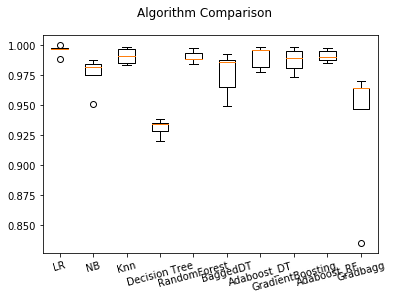

In [349]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='roc_auc')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

In [350]:
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
model_ada=AdaBoostClassifier(n_estimators=10,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=10,random_state=0)
bag_model=BaggingClassifier(n_estimators=100,random_state=0)
model_xgb=XGBClassifier(n_estimators=100,learning_rate=0.056,objective='reg:squarederror',booster='gbtree',max_depth=5)
bag_grad=BaggingClassifier(base_estimator=model_grad,n_estimators=1,random_state=0)
#fully grown decision tree high bias error

In [351]:
models=[]
models.append(('Decision Tree',dt_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('xgb',model_xgb))
models.append(('baggedgrad',bag_grad))

Decision Tree: 93.124349
		Bais error :  0.06875651274389794
		Variance error:  5.2214190458347503e-05
BaggedDT: 98.755652
		Bais error :  0.012443482014632856
		Variance error:  4.635026748807763e-05
Adaboost_DT: 98.663514
		Bais error :  0.01336485566944945
		Variance error:  8.111212108645868e-05
GradientBoosting: 97.918166
		Bais error :  0.020818343338041778
		Variance error:  0.00024128571703894915
xgb: 98.752135
		Bais error :  0.01247865130445247
		Variance error:  7.689146635063441e-05
baggedgrad: 93.627753
		Bais error :  0.06372246898841749
		Variance error:  0.0032441035863284857


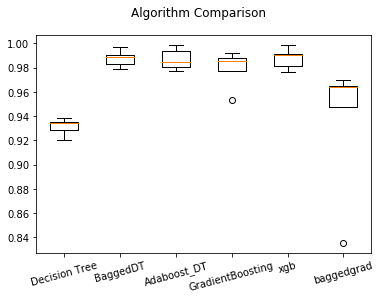

In [352]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='roc_auc')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

for classifier we should try to increase the value and is opposite in regression

Logistic is best model here

In [353]:
model_log.fit(x[:500],y[:500])
ypred=model_log.predict([x.iloc[501,:]])
ypred



C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([1], dtype=int64)

In [354]:
y[501]

1

# WIne Red

In [389]:
df=pd.read_csv("winequality-red.xls")

In [390]:
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [391]:
df.corr()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
fixed_acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668,0.124052
volatile_acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288,-0.390558
citric_acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903,0.226373
residual_sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075,0.013732
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141,-0.128907
free_sulfur_dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408,-0.050656
total_sulfur_dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654,-0.185100
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180,-0.174919
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633,-0.057731
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595,0.251397


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


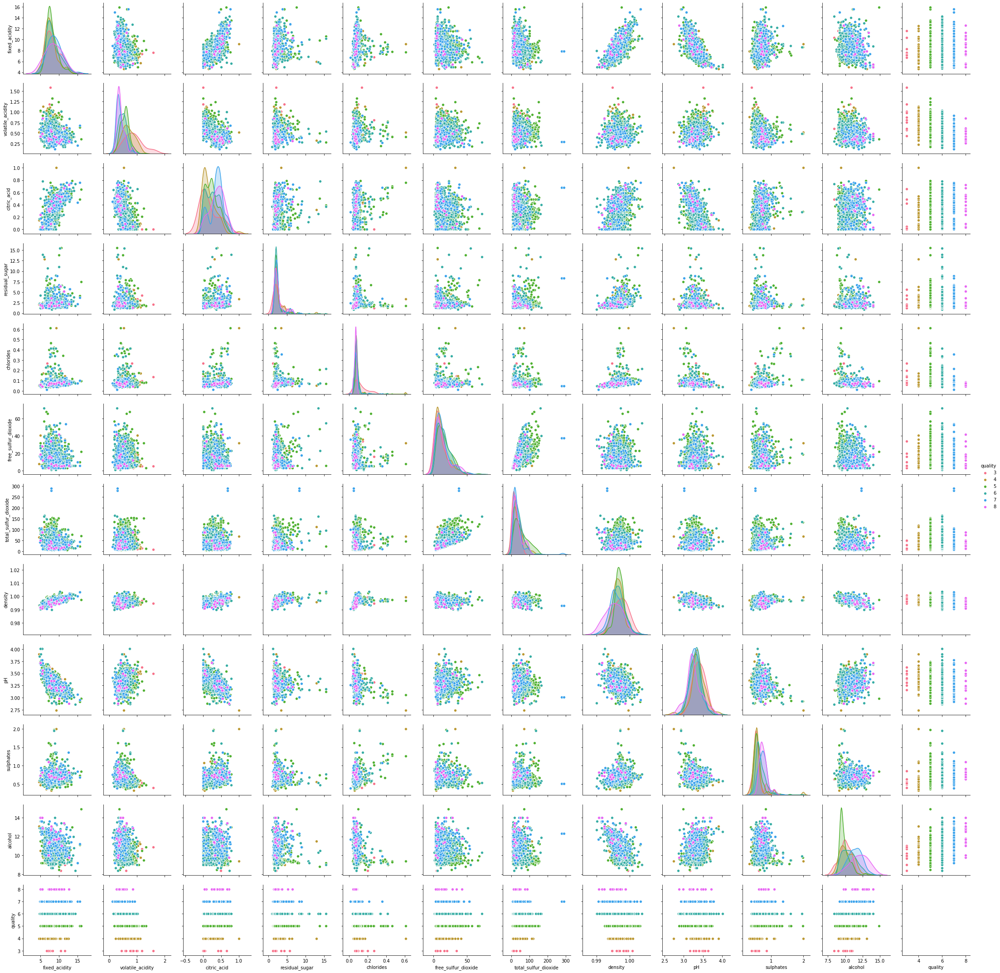

In [392]:
sns.pairplot(df,hue='quality',palette='husl')

In [393]:
df.shape

(1599, 12)

In [395]:
df.columns

Index(['fixed_acidity', 'volatile_acidity', 'citric_acid', 'residual_sugar',
       'chlorides', 'free_sulfur_dioxide', 'total_sulfur_dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [396]:
df.corr()['quality']

fixed_acidity           0.124052
volatile_acidity       -0.390558
citric_acid             0.226373
residual_sugar          0.013732
chlorides              -0.128907
free_sulfur_dioxide    -0.050656
total_sulfur_dioxide   -0.185100
density                -0.174919
pH                     -0.057731
sulphates               0.251397
alcohol                 0.476166
quality                 1.000000
Name: quality, dtype: float64

In [399]:
g3=df[df['quality']==3]['residual_sugar']
g4=df[df['quality']==4]['residual_sugar']
g5=df[df['quality']==5]['residual_sugar']
g6=df[df['quality']==6]['residual_sugar']
g7=df[df['quality']==7]['residual_sugar']
g8=df[df['quality']==8]['residual_sugar']

In [400]:
import scipy.stats as stats
stats.f_oneway(g3,g4,g5,g6,g7,g8)

F_onewayResult(statistic=1.0533735778522084, pvalue=0.3846187754292449)

In [401]:
g3=df[df['quality']==3]['pH']
g4=df[df['quality']==4]['pH']
g5=df[df['quality']==5]['pH']
g6=df[df['quality']==6]['pH']
g7=df[df['quality']==7]['pH']
g8=df[df['quality']==8]['pH']

In [402]:
import scipy.stats as stats
stats.f_oneway(g3,g4,g5,g6,g7,g8)

F_onewayResult(statistic=4.341764303214791, pvalue=0.00062843887009581)

In [403]:
g3=df[df['quality']==3]['free_sulfur_dioxide']
g4=df[df['quality']==4]['free_sulfur_dioxide']
g5=df[df['quality']==5]['free_sulfur_dioxide']
g6=df[df['quality']==6]['free_sulfur_dioxide']
g7=df[df['quality']==7]['free_sulfur_dioxide']
g8=df[df['quality']==8]['free_sulfur_dioxide']

In [404]:
import scipy.stats as stats
stats.f_oneway(g3,g4,g5,g6,g7,g8)

F_onewayResult(statistic=4.754233103987794, pvalue=0.00025708272340177853)

In [505]:
a = df.groupby('quality')
q3 = a.get_group(3)
q4 = a.get_group(4)
q5 = a.get_group(5)
q6 = a.get_group(6)
q7 = a.get_group(7)
q8 = a.get_group(8)
a1 = q3.iloc[:3,:]
a2 = q4.iloc[:7,:]
a3 = q5.iloc[:42,:]
a4 = q6.iloc[:25,:]
a5 = q7.iloc[:15,:]
a6 = q8.iloc[:4,:]
df_prod = pd.concat([a1,a2,a3,a4,a5,a6],axis=0)
df_prod.shape

(96, 12)

In [506]:
a = df.groupby('quality')
q3 = a.get_group(3)
q4 = a.get_group(4)
q5 = a.get_group(5)
q6 = a.get_group(6)
q7 = a.get_group(7)
q8 = a.get_group(8)
a1 = q3.iloc[3:,:]
a2 = q4.iloc[7:,:]
a3 = q5.iloc[42:,:]
a4 = q6.iloc[25:,:]
a5 = q7.iloc[15:,:]
a6 = q8.iloc[4:,:]
df_train = pd.concat([a1,a2,a3,a4,a5,a6],axis=0)
df_train.shape

(1503, 12)

In [507]:
X=df_train.drop(['quality','residual_sugar'],axis=1)
y=df_train['quality']

In [508]:
model_log=LogisticRegression()
models=[]
models.append(('LR',model_log))

In [513]:
knn=KNeighborsClassifier(n_neighbors=23,weights='distance')
navbayes_model=GaussianNB()
model_log=LogisticRegression()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
rf_model=RandomForestClassifier(n_estimators=2153,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=600,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=50,random_state=0)#fully grown decision tree high bias error

In [514]:
models=[]
models.append(('LR',model_log))
models.append(('NB',navbayes_model))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))

LR: 54.031875
		Bais error :  0.45968124742046235
		Variance error:  0.04429819147028266
NB: 56.811844
		Bais error :  0.43188155874540635
		Variance error:  0.04660301417945567
Knn: 63.461910
		Bais error :  0.3653809018613263
		Variance error:  0.027685344109496836
Decision Tree: 66.202707
		Bais error :  0.33797292980977345
		Variance error:  0.02858921552643957
RandomForest: 69.485903
		Bais error :  0.3051409657252081
		Variance error:  0.028471246040613508
BaggedDT: 67.683363
		Bais error :  0.32316637185116326
		Variance error:  0.03301053480742744
Adaboost_DT: 49.708207
		Bais error :  0.5029179265794681
		Variance error:  0.04063942334355316
GradientBoosting: 67.316499
		Bais error :  0.32683500964540335
		Variance error:  0.031146923665250882
Adaboost_RF: 69.529632
		Bais error :  0.30470368143257676
		Variance error:  0.02873905699888455
Gradbagg: 56.452630
		Bais error :  0.4354737049603743
		Variance error:  0.04359164040836108


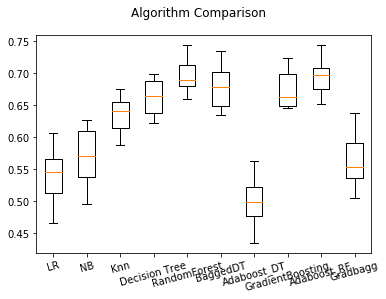

In [515]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10,shuffle=True,random_state=0)
    auc =cross_val_score(model,X,y,cv=kfold,scoring='f1_weighted')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.std(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

In [517]:
df_prod

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
459,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.0,3
517,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.4,3
690,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.7,3
18,7.4,0.590,0.08,4.40,0.086,6.0,29.0,0.99740,3.38,0.50,9.0,4
38,5.7,1.130,0.09,1.50,0.172,7.0,19.0,0.99400,3.50,0.48,9.8,4
41,8.8,0.610,0.30,2.80,0.088,17.0,46.0,0.99760,3.26,0.51,9.3,4
45,4.6,0.520,0.15,2.10,0.054,8.0,65.0,0.99340,3.90,0.56,13.1,4
73,8.3,0.675,0.26,2.10,0.084,11.0,43.0,0.99760,3.31,0.53,9.2,4
79,8.3,0.625,0.20,1.50,0.080,27.0,119.0,0.99720,3.16,1.12,9.1,4
94,5.0,1.020,0.04,1.40,0.045,41.0,85.0,0.99380,3.75,0.48,10.5,4


In [522]:
xtest=df_prod.drop(['quality','residual_sugar'],axis=1)

In [523]:
model_ada_rf.fit(X,y)
yprod=model_ada_rf.predict(xtest)

In [529]:
from sklearn.metrics import classification_report,confusion_matrix
print(classification_report(df_prod['quality'],yprod))
print(confusion_matrix(df_prod['quality'],yprod))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00         7
           5       0.57      0.90      0.70        42
           6       0.35      0.32      0.33        25
           7       0.50      0.20      0.29        15
           8       0.00      0.00      0.00         4

    accuracy                           0.51        96
   macro avg       0.24      0.24      0.22        96
weighted avg       0.42      0.51      0.44        96

[[ 0  0  2  1  0  0]
 [ 0  0  6  1  0  0]
 [ 0  0 38  4  0  0]
 [ 0  0 17  8  0  0]
 [ 0  0  4  8  3  0]
 [ 0  0  0  1  3  0]]


In [414]:
knn=KNeighborsClassifier()
params={'n_neighbors':np.arange(1,200),'weights':['uniform','distance']}
GS=GridSearchCV(knn,params,cv=7,scoring='f1_weighted')
GS.fit(X,y)

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\

GridSearchCV(cv=7, error_score='raise-deprecating',
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='warn', n_jobs=None,
             param_grid={'n_neighbors': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,...
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
       183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
       196, 197, 198, 199]),
         

In [415]:
GS.best_params_

{'n_neighbors': 23, 'weights': 'distance'}

In [416]:
knn=KNeighborsRegressor(n_neighbors=23,weights='distance')

In [417]:
knn=KNeighborsClassifier(n_neighbors=23,weights='distance')
navbayes_model=GaussianNB()
model_log=LogisticRegression()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
rf_model=RandomForestClassifier(n_estimators=537,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=2600,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=100,random_state=0)#fully grown decision tree high bias error

In [418]:
models=[]
models.append(('LR',model_log))
models.append(('NB',navbayes_model))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))

C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:4

LR: 53.624542
		Bais error :  0.46375457966799494
		Variance error:  0.002152773860948522
NB: 55.831643
		Bais error :  0.4416835674472147
		Variance error:  0.00044138620594721717
Knn: 59.618435
		Bais error :  0.403815652394234
		Variance error:  0.00036630016542466926
Decision Tree: 61.254335
		Bais error :  0.3874566464155744
		Variance error:  0.001019065385808014


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-pack

RandomForest: 67.735832
		Bais error :  0.3226416786567604
		Variance error:  9.602806733761504e-05


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


BaggedDT: 63.193068
		Bais error :  0.3680693154768553
		Variance error:  0.00023289813268041214


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Adaboost_DT: 50.343605
		Bais error :  0.4965639543976028
		Variance error:  0.0029631583253621257


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


GradientBoosting: 64.790924
		Bais error :  0.3520907569881795
		Variance error:  0.00030147929647048386


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Adaboost_RF: 68.543186
		Bais error :  0.3145681376540438
		Variance error:  0.00017413538237842174


C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Jasar Althaf\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


Gradbagg: 55.726529
		Bais error :  0.4427347069528972
		Variance error:  0.0002514449936415056


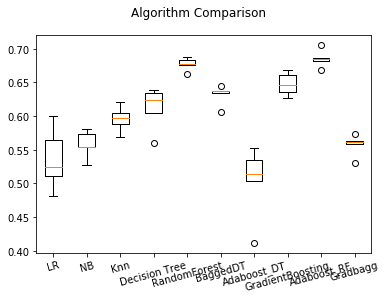

In [419]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X,y,cv=kfold,scoring='f1_weighted')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

In [420]:
import warnings
warnings.filterwarnings("ignore")

# with pca

In [421]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
for i in X.columns:
    X[i]=sc.fit_transform(X[[i]])

In [422]:
eig_val,eig_vec=np.linalg.eig(X.cov())

In [423]:
eig_pairs=[(eig_val[index],eig_vec[:,index]) for index in range(len(eig_val))]

eig_pairs.sort()
eig_pairs.reverse()

eig_pairs

eig_val_sort=[eig_pairs[index][0] for index in range(len(eig_val))]
eig_vec_sort=[eig_pairs[index][1] for index in range(len(eig_val))]

In [424]:
tot=sum(eig_val_sort)
var_exp=[(i/tot)*100 for i in sorted(eig_val,reverse=True)]
cum_var_exp=np.cumsum(var_exp)
print("Cummulative Variance Explained ",cum_var_exp)

Cummulative Variance Explained  [ 30.55317854  49.06567605  64.49418525  76.13023832  82.76441121
  89.13371092  93.81772014  97.26437393  99.14795431 100.        ]


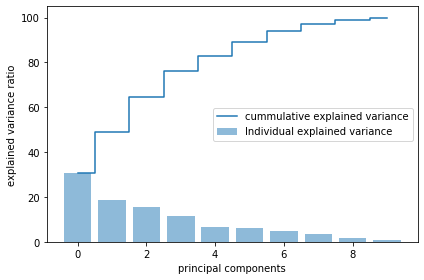

In [425]:
plt.figure(figsize=(6,4))
plt.bar(range(X.shape[1]),var_exp,alpha=0.5,align='center',label='Individual explained variance')
plt.step(range(X.shape[1]),cum_var_exp,where='mid',label='cummulative explained variance')
plt.ylabel("explained variance ratio")
plt.xlabel("principal components")
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [426]:
eig_vec_sort=np.array(eig_vec_sort[::]).T

In [432]:
P_reduce=eig_vec_sort[:,:8] #1 dimension which has low variance ratio we reduce

In [433]:
P_reduce.shape

(10, 8)

In [434]:
dfpca=np.dot(X,P_reduce)

In [435]:
X_PCA=pd.DataFrame(dfpca,columns='pc1 pc2 pc3 pc4 pc5 pc6 pc7 pc8'.split())
X_PCA.head()

,pc1,pc2,pc3,pc4,pc5,pc6,pc7,pc8
0,-1.579816,0.568078,-1.732398,-0.082881,0.926088,0.113545,0.164216,-0.000785
1,-0.864401,1.929410,-0.756157,-0.426699,-0.686228,-0.973338,-1.020112,0.514987
2,-0.750356,0.996979,-1.078094,-0.353237,-0.310671,-0.415510,-0.736394,0.081701
3,2.444523,-0.027423,0.305346,1.491981,-0.148450,0.659961,0.285685,-0.083021
4,-1.579816,0.568078,-1.732398,-0.082881,0.926088,0.113545,0.164216,-0.000785


In [439]:
knn=KNeighborsClassifier(n_neighbors=23,weights='distance')
navbayes_model=GaussianNB()
model_log=LogisticRegression()
dt_model=DecisionTreeClassifier(criterion='entropy',random_state=0)
rf_model=RandomForestClassifier(n_estimators=537,criterion='entropy',random_state=0)
bag_model=BaggingClassifier(n_estimators=10,random_state=0)
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)#default decision tree
model_grad=GradientBoostingClassifier(n_estimators=600,random_state=0)
model_ada_rf=AdaBoostClassifier(base_estimator=rf_model,n_estimators=100,random_state=0)#fully grown decision tree high bias error

In [440]:
models=[]
models.append(('LR',model_log))
models.append(('NB',navbayes_model))
models.append(('Knn',knn))
models.append(('Decision Tree',dt_model))
models.append(('RandomForest',rf_model))
models.append(('BaggedDT',bag_model))
models.append(('Adaboost_DT',model_ada))
models.append(('GradientBoosting',model_grad))
models.append(('Adaboost_RF',model_ada_rf))
models.append(('Gradbagg',bag_grad))

LR: 54.589434
		Bais error :  0.4541056600464879
		Variance error:  0.0028912719336778793
NB: 54.960496
		Bais error :  0.4503950393993639
		Variance error:  0.0007756093733293308
Knn: 65.746042
		Bais error :  0.3425395832709641
		Variance error:  2.3538057601595433e-05
Decision Tree: 60.793464
		Bais error :  0.3920653621690273
		Variance error:  0.0026859859255107415
RandomForest: 66.992974
		Bais error :  0.3300702577676
		Variance error:  0.0007049704634656596
BaggedDT: 65.053058
		Bais error :  0.34946942035743744
		Variance error:  0.00029568004571327533
Adaboost_DT: 47.498560
		Bais error :  0.5250143969766181
		Variance error:  0.0012409521178319745
GradientBoosting: 66.305463
		Bais error :  0.33694537496191945
		Variance error:  0.0005292533106037444
Adaboost_RF: 67.360073
		Bais error :  0.32639926944933983
		Variance error:  0.0003752673516024714
Gradbagg: 56.352354
		Bais error :  0.436476462059846
		Variance error:  0.001394931686512583


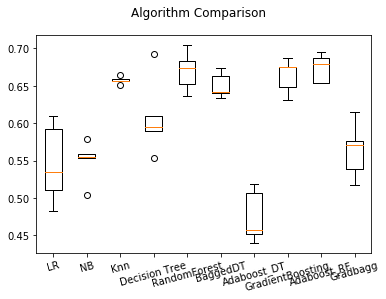

In [441]:
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=5,shuffle=True,random_state=0)
    auc =cross_val_score(model,X_PCA,y,cv=kfold,scoring='f1_weighted')
    results.append(auc)
    names.append(name)
    print('%s: %f' % (name,np.mean(auc*100)))
    BE =1-np.mean(auc)#Bias error
    VE =np.var(1-auc,ddof=1)#variance error
    print("\t\tBais error : ", BE)
    print("\t\tVariance error: ",VE)
    
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.xticks(rotation=15)
plt.show()

# SVM

In [525]:
df=pd.DataFrame({'x1':[3,3,6,6,1,0,0,1],'x2':[1,-1,1,-1,0,1,-1,0],'class':[1,1,1,1,-1,-1,-1,-1]})

In [526]:
df.head()

,x1,x2,class
0,3,1,1
1,3,-1,1
2,6,1,1
3,6,-1,1
4,1,0,-1


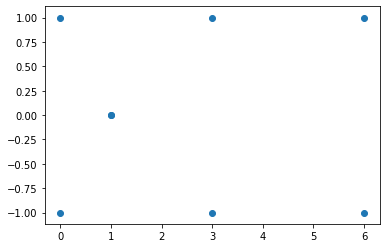

In [527]:
plt.scatter(df['x1'],df['x2'])

In [ ]:
s1=[3,1]
s2=[1,0]
s3=[3,-1]
